# IMPORTING NECESSARY LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# LOADING DATASET

## NET MIGRATION BY COUNTRY (2000-2023)

In [2]:
df1=pd.read_csv("net_migration_data.csv")
df1

,Indicator Name,Indicator Code,Country Name,Country Code,2000,2001,2002,2003,2004,2005,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Net migration,SM.POP.NETM,Aruba,ABW,1235,560,350,324,315,579,...,88,177,170,218,367,412,0,501,164,157
1,Net migration,SM.POP.NETM,Afghanistan,AFG,-1007135,-192286,1327074,388632,-248616,252185,...,255611,-281739,-90238,-47090,-47205,-8082,166821,-183672,-65846,-65846
2,Net migration,SM.POP.NETM,Angola,AGO,53527,56959,60505,59438,66585,64009,...,84532,74170,91623,77733,61632,58986,7557,29089,-1000,-1000
3,Net migration,SM.POP.NETM,Albania,ALB,-63610,-62059,-59876,-57308,-54383,-50855,...,-14265,-12240,-10887,-9768,-9106,-8889,-9117,-10612,-8000,-8000
4,Net migration,SM.POP.NETM,Andorra,AND,146,2690,2690,2722,2744,2467,...,-84,-232,1303,887,1184,1238,1474,1377,200,200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,Net migration,SM.POP.NETM,Kosovo,XKX,-9176,-1995,-29565,-27077,-30715,-33861,...,-56637,-14819,-31383,-33495,-34137,-33469,-15050,-15050,-5000,-5000
212,Net migration,SM.POP.NETM,"Yemen, Rep.",YEM,-87753,-93742,-99706,-104794,-102701,-51360,...,-30048,-38355,-39688,-39672,-39699,-39769,-86100,-101468,-29998,-29914
213,Net migration,SM.POP.NETM,South Africa,ZAF,-80388,-29826,50323,65721,58977,31424,...,290874,644996,-866101,-10681,27265,22728,30852,10934,58496,58496
214,Net migration,SM.POP.NETM,Zambia,ZMB,-5152,23832,3209,20873,7828,35351,...,16580,16283,17285,20268,18019,18019,9015,9015,-5000,-5000


## COUNTRY CLASSIFICATION BY REGION AND INCOME GROUP

In [3]:
df2=pd.read_csv("region_and_income_group.csv")
df2

,Country Code,Region,IncomeGroup,TableName
0,ABW,Latin America & Caribbean,High income,Aruba
1,AFG,South Asia,Low income,Afghanistan
2,AGO,Sub-Saharan Africa,Lower middle income,Angola
3,ALB,Europe & Central Asia,Upper middle income,Albania
4,AND,Europe & Central Asia,High income,Andorra
...,...,...,...,...
211,XKX,Europe & Central Asia,Upper middle income,Kosovo
212,YEM,Middle East & North Africa,Low income,"Yemen, Rep."
213,ZAF,Sub-Saharan Africa,Upper middle income,South Africa
214,ZMB,Sub-Saharan Africa,Lower middle income,Zambia


# DATA MERGING

In [4]:
df = pd.merge(df1, df2, on='Country Code', how='inner')

# LOADING FINAL DATASET

## NET MIGRATION BY COUNTRY (2000-2023) WITH REGIONAL AND INCOME GROUP CLASSIFICATIONS

In [5]:
df.to_csv('net_migration_data_final.csv', index=False)
df

,Indicator Name,Indicator Code,Country Name,Country Code,2000,2001,2002,2003,2004,2005,...,2017,2018,2019,2020,2021,2022,2023,Region,IncomeGroup,TableName
0,Net migration,SM.POP.NETM,Aruba,ABW,1235,560,350,324,315,579,...,218,367,412,0,501,164,157,Latin America & Caribbean,High income,Aruba
1,Net migration,SM.POP.NETM,Afghanistan,AFG,-1007135,-192286,1327074,388632,-248616,252185,...,-47090,-47205,-8082,166821,-183672,-65846,-65846,South Asia,Low income,Afghanistan
2,Net migration,SM.POP.NETM,Angola,AGO,53527,56959,60505,59438,66585,64009,...,77733,61632,58986,7557,29089,-1000,-1000,Sub-Saharan Africa,Lower middle income,Angola
3,Net migration,SM.POP.NETM,Albania,ALB,-63610,-62059,-59876,-57308,-54383,-50855,...,-9768,-9106,-8889,-9117,-10612,-8000,-8000,Europe & Central Asia,Upper middle income,Albania
4,Net migration,SM.POP.NETM,Andorra,AND,146,2690,2690,2722,2744,2467,...,887,1184,1238,1474,1377,200,200,Europe & Central Asia,High income,Andorra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,Net migration,SM.POP.NETM,Kosovo,XKX,-9176,-1995,-29565,-27077,-30715,-33861,...,-33495,-34137,-33469,-15050,-15050,-5000,-5000,Europe & Central Asia,Upper middle income,Kosovo
212,Net migration,SM.POP.NETM,"Yemen, Rep.",YEM,-87753,-93742,-99706,-104794,-102701,-51360,...,-39672,-39699,-39769,-86100,-101468,-29998,-29914,Middle East & North Africa,Low income,"Yemen, Rep."
213,Net migration,SM.POP.NETM,South Africa,ZAF,-80388,-29826,50323,65721,58977,31424,...,-10681,27265,22728,30852,10934,58496,58496,Sub-Saharan Africa,Upper middle income,South Africa
214,Net migration,SM.POP.NETM,Zambia,ZMB,-5152,23832,3209,20873,7828,35351,...,20268,18019,18019,9015,9015,-5000,-5000,Sub-Saharan Africa,Lower middle income,Zambia


# DATA CLEANING

## DROPPING REDUNDANT COLUMNS

In [6]:
df.drop(columns=['TableName'], inplace=True) 

## DROPPING UNNECESSARY COLUMNS

In [7]:
df.drop(['Indicator Name'],axis=1,inplace=True)

## ASSIGNING COLUMN ORDER

In [8]:
preferred_column_order = ['Indicator Code', 'Country Name', 'Country Code', 'Region', 'IncomeGroup', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014','2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023']
df = df[preferred_column_order]

## HANDLING FOR MISSING VALUES

In [9]:
df.isna().sum()

Indicator Code    0
Country Name      0
Country Code      0
Region            0
IncomeGroup       0
2000              0
2001              0
2002              0
2003              0
2004              0
2005              0
2006              0
2007              0
2008              0
2009              0
2010              0
2011              0
2012              0
2013              0
2014              0
2015              0
2016              0
2017              0
2018              0
2019              0
2020              0
2021              0
2022              0
2023              0
dtype: int64

## HANDLING FOR DUPLICATE VALUES

In [10]:
df.duplicated().sum()

0

## DATATYPE CONVERSION

In [11]:
df.dtypes

Indicator Code    object
Country Name      object
Country Code      object
Region            object
IncomeGroup       object
2000               int64
2001               int64
2002               int64
2003               int64
2004               int64
2005               int64
2006               int64
2007               int64
2008               int64
2009               int64
2010               int64
2011               int64
2012               int64
2013               int64
2014               int64
2015               int64
2016               int64
2017               int64
2018               int64
2019               int64
2020               int64
2021               int64
2022               int64
2023               int64
dtype: object

In [12]:
df['Region'] = df['Region'].astype('category')
df['IncomeGroup'] = df['IncomeGroup'].astype('category')

df.dtypes

Indicator Code      object
Country Name        object
Country Code        object
Region            category
IncomeGroup       category
2000                 int64
2001                 int64
2002                 int64
2003                 int64
2004                 int64
2005                 int64
2006                 int64
2007                 int64
2008                 int64
2009                 int64
2010                 int64
2011                 int64
2012                 int64
2013                 int64
2014                 int64
2015                 int64
2016                 int64
2017                 int64
2018                 int64
2019                 int64
2020                 int64
2021                 int64
2022                 int64
2023                 int64
dtype: object

# DATA EXPLORATION

## DISPLAYING THE DATASET

In [13]:
df

,Indicator Code,Country Name,Country Code,Region,IncomeGroup,2000,2001,2002,2003,2004,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,SM.POP.NETM,Aruba,ABW,Latin America & Caribbean,High income,1235,560,350,324,315,...,88,177,170,218,367,412,0,501,164,157
1,SM.POP.NETM,Afghanistan,AFG,South Asia,Low income,-1007135,-192286,1327074,388632,-248616,...,255611,-281739,-90238,-47090,-47205,-8082,166821,-183672,-65846,-65846
2,SM.POP.NETM,Angola,AGO,Sub-Saharan Africa,Lower middle income,53527,56959,60505,59438,66585,...,84532,74170,91623,77733,61632,58986,7557,29089,-1000,-1000
3,SM.POP.NETM,Albania,ALB,Europe & Central Asia,Upper middle income,-63610,-62059,-59876,-57308,-54383,...,-14265,-12240,-10887,-9768,-9106,-8889,-9117,-10612,-8000,-8000
4,SM.POP.NETM,Andorra,AND,Europe & Central Asia,High income,146,2690,2690,2722,2744,...,-84,-232,1303,887,1184,1238,1474,1377,200,200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,SM.POP.NETM,Kosovo,XKX,Europe & Central Asia,Upper middle income,-9176,-1995,-29565,-27077,-30715,...,-56637,-14819,-31383,-33495,-34137,-33469,-15050,-15050,-5000,-5000
212,SM.POP.NETM,"Yemen, Rep.",YEM,Middle East & North Africa,Low income,-87753,-93742,-99706,-104794,-102701,...,-30048,-38355,-39688,-39672,-39699,-39769,-86100,-101468,-29998,-29914
213,SM.POP.NETM,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,-80388,-29826,50323,65721,58977,...,290874,644996,-866101,-10681,27265,22728,30852,10934,58496,58496
214,SM.POP.NETM,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,-5152,23832,3209,20873,7828,...,16580,16283,17285,20268,18019,18019,9015,9015,-5000,-5000


In [14]:
df.head(5)

,Indicator Code,Country Name,Country Code,Region,IncomeGroup,2000,2001,2002,2003,2004,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,SM.POP.NETM,Aruba,ABW,Latin America & Caribbean,High income,1235,560,350,324,315,...,88,177,170,218,367,412,0,501,164,157
1,SM.POP.NETM,Afghanistan,AFG,South Asia,Low income,-1007135,-192286,1327074,388632,-248616,...,255611,-281739,-90238,-47090,-47205,-8082,166821,-183672,-65846,-65846
2,SM.POP.NETM,Angola,AGO,Sub-Saharan Africa,Lower middle income,53527,56959,60505,59438,66585,...,84532,74170,91623,77733,61632,58986,7557,29089,-1000,-1000
3,SM.POP.NETM,Albania,ALB,Europe & Central Asia,Upper middle income,-63610,-62059,-59876,-57308,-54383,...,-14265,-12240,-10887,-9768,-9106,-8889,-9117,-10612,-8000,-8000
4,SM.POP.NETM,Andorra,AND,Europe & Central Asia,High income,146,2690,2690,2722,2744,...,-84,-232,1303,887,1184,1238,1474,1377,200,200


In [15]:
df.tail(5)

,Indicator Code,Country Name,Country Code,Region,IncomeGroup,2000,2001,2002,2003,2004,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
211,SM.POP.NETM,Kosovo,XKX,Europe & Central Asia,Upper middle income,-9176,-1995,-29565,-27077,-30715,...,-56637,-14819,-31383,-33495,-34137,-33469,-15050,-15050,-5000,-5000
212,SM.POP.NETM,"Yemen, Rep.",YEM,Middle East & North Africa,Low income,-87753,-93742,-99706,-104794,-102701,...,-30048,-38355,-39688,-39672,-39699,-39769,-86100,-101468,-29998,-29914
213,SM.POP.NETM,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,-80388,-29826,50323,65721,58977,...,290874,644996,-866101,-10681,27265,22728,30852,10934,58496,58496
214,SM.POP.NETM,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,-5152,23832,3209,20873,7828,...,16580,16283,17285,20268,18019,18019,9015,9015,-5000,-5000
215,SM.POP.NETM,Zimbabwe,ZWE,Sub-Saharan Africa,Lower middle income,-137321,-136966,-147110,-118634,-156566,...,-59918,-59918,-59918,-59918,-59918,-59918,-29955,-25005,-9999,-9999


## SHAPE OF THE DATASET

In [16]:
df.shape

(216, 29)

## STRUCTURE OF THE DATASET

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 29 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Indicator Code  216 non-null    object  
 1   Country Name    216 non-null    object  
 2   Country Code    216 non-null    object  
 3   Region          216 non-null    category
 4   IncomeGroup     216 non-null    category
 5   2000            216 non-null    int64   
 6   2001            216 non-null    int64   
 7   2002            216 non-null    int64   
 8   2003            216 non-null    int64   
 9   2004            216 non-null    int64   
 10  2005            216 non-null    int64   
 11  2006            216 non-null    int64   
 12  2007            216 non-null    int64   
 13  2008            216 non-null    int64   
 14  2009            216 non-null    int64   
 15  2010            216 non-null    int64   
 16  2011            216 non-null    int64   
 17  2012            

In [18]:
df.columns

Index(['Indicator Code', 'Country Name', 'Country Code', 'Region',
       'IncomeGroup', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023'],
      dtype='object')

## UNIQUE VALUES FOR COLUMNS

### COUNTRY NAME

In [19]:
print(df['Country Name'].unique())
print("\n TOTAL NO OF UNIQUE COUNTRIES:", df['Country Name'].nunique())

['Aruba' 'Afghanistan' 'Angola' 'Albania' 'Andorra' 'United Arab Emirates'
 'Argentina' 'Armenia' 'American Samoa' 'Antigua and Barbuda' 'Australia'
 'Austria' 'Azerbaijan' 'Burundi' 'Belgium' 'Benin' 'Burkina Faso'
 'Bangladesh' 'Bulgaria' 'Bahrain' 'Bahamas, The' 'Bosnia and Herzegovina'
 'Belarus' 'Belize' 'Bermuda' 'Bolivia' 'Brazil' 'Barbados'
 'Brunei Darussalam' 'Bhutan' 'Botswana' 'Canada' 'Switzerland'
 'Channel Islands' 'Chile' 'China' "Cote d'Ivoire" 'Cameroon'
 'Congo, Dem. Rep.' 'Congo, Rep.' 'Colombia' 'Comoros' 'Cabo Verde'
 'Costa Rica' 'Cuba' 'Curacao' 'Cayman Islands' 'Cyprus' 'Czechia'
 'Germany' 'Djibouti' 'Dominica' 'Denmark' 'Dominican Republic' 'Algeria'
 'Ecuador' 'Egypt, Arab Rep.' 'Eritrea' 'Spain' 'Estonia' 'Ethiopia'
 'Finland' 'Fiji' 'France' 'Faroe Islands' 'Micronesia, Fed. Sts.' 'Gabon'
 'United Kingdom' 'Georgia' 'Ghana' 'Gibraltar' 'Guinea' 'Gambia, The'
 'Guinea-Bissau' 'Equatorial Guinea' 'Greece' 'Grenada' 'Greenland'
 'Guatemala' 'Guam' 'Guyana' 'H

### COUNTRY CODE

In [20]:
print(df['Country Code'].unique())
print("\n TOTAL NO OF UNIQUE COUNTRY CODES:", df['Country Code'].nunique())

['ABW' 'AFG' 'AGO' 'ALB' 'AND' 'ARE' 'ARG' 'ARM' 'ASM' 'ATG' 'AUS' 'AUT'
 'AZE' 'BDI' 'BEL' 'BEN' 'BFA' 'BGD' 'BGR' 'BHR' 'BHS' 'BIH' 'BLR' 'BLZ'
 'BMU' 'BOL' 'BRA' 'BRB' 'BRN' 'BTN' 'BWA' 'CAN' 'CHE' 'CHI' 'CHL' 'CHN'
 'CIV' 'CMR' 'COD' 'COG' 'COL' 'COM' 'CPV' 'CRI' 'CUB' 'CUW' 'CYM' 'CYP'
 'CZE' 'DEU' 'DJI' 'DMA' 'DNK' 'DOM' 'DZA' 'ECU' 'EGY' 'ERI' 'ESP' 'EST'
 'ETH' 'FIN' 'FJI' 'FRA' 'FRO' 'FSM' 'GAB' 'GBR' 'GEO' 'GHA' 'GIB' 'GIN'
 'GMB' 'GNB' 'GNQ' 'GRC' 'GRD' 'GRL' 'GTM' 'GUM' 'GUY' 'HKG' 'HND' 'HRV'
 'HTI' 'HUN' 'IDN' 'IMN' 'IND' 'IRL' 'IRN' 'IRQ' 'ISL' 'ISR' 'ITA' 'JAM'
 'JOR' 'JPN' 'KAZ' 'KEN' 'KGZ' 'KHM' 'KIR' 'KNA' 'KOR' 'KWT' 'LAO' 'LBN'
 'LBR' 'LBY' 'LCA' 'LIE' 'LKA' 'LSO' 'LTU' 'LUX' 'LVA' 'MAC' 'MAF' 'MAR'
 'MCO' 'MDA' 'MDG' 'MDV' 'MEX' 'MHL' 'MKD' 'MLI' 'MLT' 'MMR' 'MNE' 'MNG'
 'MNP' 'MOZ' 'MRT' 'MUS' 'MWI' 'MYS' 'NAM' 'NCL' 'NER' 'NGA' 'NIC' 'NLD'
 'NOR' 'NPL' 'NRU' 'NZL' 'OMN' 'PAK' 'PAN' 'PER' 'PHL' 'PLW' 'PNG' 'POL'
 'PRI' 'PRK' 'PRT' 'PRY' 'PSE' 'PYF' 'QAT' 'ROU' 'R

### REGION

In [21]:
print(df['Region'].unique())
print("\n TOTAL NO OF UNIQUE REGION:", df['Region'].nunique())

['Latin America & Caribbean', 'South Asia', 'Sub-Saharan Africa', 'Europe & Central Asia', 'Middle East & North Africa', 'East Asia & Pacific', 'North America']
Categories (7, object): ['East Asia & Pacific', 'Europe & Central Asia', 'Latin America & Caribbean', 'Middle East & North Africa', 'North America', 'South Asia', 'Sub-Saharan Africa']

 TOTAL NO OF UNIQUE REGION: 7


### INCOME GROUP

In [22]:
print(df['IncomeGroup'].unique())
print("\n TOTAL NO OF UNIQUE INCOME GROUP:", df['IncomeGroup'].nunique())

['High income', 'Low income', 'Lower middle income', 'Upper middle income']
Categories (4, object): ['High income', 'Low income', 'Lower middle income', 'Upper middle income']

 TOTAL NO OF UNIQUE INCOME GROUP: 4


# DESCRIPTIVE STATISTICS

## SUMMARY STATISTIC OF NUMERICAL COLUMNS

In [23]:
df.describe()

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
count,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,...,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,2.160000e+02,216.000000,2.160000e+02,2.160000e+02
mean,2.783796e+01,1.316019e+02,-5.824537e+01,6.834722e+01,9.579630e+01,9.837963e+01,1.807731e+02,1.365833e+02,1.647731e+02,1.696250e+02,...,6.315185e+02,1.661157e+02,1.186620e+02,1.201019e+02,9.276389e+01,2.331481e+01,-2.063426e+01,262.087963,-5.154167e+01,-6.437037e+01
std,1.622041e+05,1.245194e+05,1.670881e+05,1.341741e+05,1.338137e+05,1.468459e+05,1.953770e+05,2.013233e+05,1.880455e+05,1.474829e+05,...,2.254945e+05,2.110885e+05,2.138099e+05,1.801358e+05,1.856494e+05,1.649154e+05,1.185830e+05,89375.227736,5.320750e+05,1.767892e+05
min,-1.007135e+06,-4.854190e+05,-8.345460e+05,-5.782250e+05,-5.351750e+05,-7.159700e+05,-1.204180e+06,-9.428870e+05,-1.390782e+06,-8.034370e+05,...,-2.037911e+06,-2.172159e+06,-2.290411e+06,-1.574581e+06,-1.356759e+06,-1.177218e+06,-1.025295e+06,-525116.000000,-6.673580e+06,-9.104750e+05
25%,-2.115950e+04,-2.045025e+04,-2.055600e+04,-1.980250e+04,-1.817175e+04,-2.148325e+04,-2.513950e+04,-2.005800e+04,-2.399500e+04,-2.627200e+04,...,-2.039775e+04,-1.572525e+04,-1.193075e+04,-1.294175e+04,-1.427700e+04,-1.607725e+04,-9.135000e+03,-10388.500000,-9.031250e+03,-9.999000e+03
50%,-1.240500e+03,-5.795000e+02,-1.286500e+03,-3.615000e+02,-3.275000e+02,-5.675000e+02,-1.015000e+03,-1.286000e+03,-1.220500e+03,-1.290000e+03,...,-7.920000e+02,-8.595000e+02,-3.370000e+02,-3.930000e+02,-7.915000e+02,-1.289500e+03,-2.965000e+02,-563.500000,-5.000000e+02,-8.000000e+02
75%,5.434250e+03,7.695250e+03,5.551500e+03,1.116300e+04,1.010525e+04,1.019725e+04,1.227875e+04,8.841750e+03,9.692250e+03,8.037250e+03,...,7.346750e+03,8.112500e+03,1.325400e+04,9.872750e+03,1.011625e+04,4.999000e+03,2.678500e+03,1860.750000,1.250000e+03,6.625000e+02
max,1.479676e+06,1.335725e+06,1.327074e+06,1.074728e+06,1.200409e+06,1.129462e+06,1.113259e+06,1.108509e+06,1.095864e+06,1.031010e+06,...,1.250914e+06,1.221849e+06,1.449371e+06,1.377630e+06,1.200796e+06,1.158444e+06,6.755600e+05,561580.000000,3.366387e+06,1.784718e+06


# DATA MANIPULATION

## GROUP BY REGION AND AGGREGATE COUNTRIES INTO LISTS

In [24]:
grouped = df.groupby('Region', observed=False)['Country Name'].apply(list).reset_index()

result1 = pd.DataFrame()

for income_group in grouped['Region']:
    countries = grouped.loc[grouped['Region'] == income_group, 'Country Name'].values[0]
    country_series = pd.Series(countries)
    
    if len(result1) < len(country_series):
        result1 = result1.reindex(range(len(country_series)))  
    
    result1[income_group] = country_series

result1.fillna("", inplace=True) 

result1

,East Asia & Pacific,Europe & Central Asia,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa
0,American Samoa,Albania,Aruba,United Arab Emirates,Bermuda,Afghanistan,Angola
1,Australia,Andorra,Argentina,Bahrain,Canada,Bangladesh,Burundi
2,Brunei Darussalam,Armenia,Antigua and Barbuda,Djibouti,United States,Bhutan,Benin
3,China,Austria,"Bahamas, The",Algeria,,India,Burkina Faso
4,Fiji,Azerbaijan,Belize,"Egypt, Arab Rep.",,Sri Lanka,Botswana
5,"Micronesia, Fed. Sts.",Belgium,Bolivia,"Iran, Islamic Rep.",,Maldives,Cote d'Ivoire
6,Guam,Bulgaria,Brazil,Iraq,,Nepal,Cameroon
7,"Hong Kong SAR, China",Bosnia and Herzegovina,Barbados,Israel,,Pakistan,"Congo, Dem. Rep."
8,Indonesia,Belarus,Chile,Jordan,,,"Congo, Rep."
9,Japan,Switzerland,Colombia,Kuwait,,,Comoros


In [25]:
income_group_counts = df.groupby('Region', observed=False)['Country Code'].nunique()

print(income_group_counts)

Region
East Asia & Pacific           37
Europe & Central Asia         58
Latin America & Caribbean     42
Middle East & North Africa    21
North America                  3
South Asia                     8
Sub-Saharan Africa            47
Name: Country Code, dtype: int64


## GROUP BY INCOME GROUP AND AGGREGATE COUNTRIES INTO LISTS

In [26]:
grouped = df.groupby('IncomeGroup', observed=False)['Country Name'].apply(list).reset_index()

result = pd.DataFrame()

for income_group in grouped['IncomeGroup']:
    countries = grouped.loc[grouped['IncomeGroup'] == income_group, 'Country Name'].values[0]
    country_series = pd.Series(countries if len(countries) > 0 else [""] * len(countries))
    result[income_group] = country_series

result.fillna("", inplace=True)

result

,High income,Low income,Lower middle income,Upper middle income
0,Aruba,Afghanistan,Angola,Albania
1,Andorra,Burundi,Benin,Argentina
2,United Arab Emirates,Burkina Faso,Bangladesh,Armenia
3,American Samoa,"Congo, Dem. Rep.",Bolivia,Azerbaijan
4,Antigua and Barbuda,Eritrea,Bhutan,Bosnia and Herzegovina
...,...,...,...,...
80,Trinidad and Tobago,,,
81,Uruguay,,,
82,United States,,,
83,British Virgin Islands,,,


In [27]:
income_group_counts = df.groupby('IncomeGroup', observed=False)['Country Code'].nunique()

print(income_group_counts)

IncomeGroup
High income            85
Low income             25
Lower middle income    51
Upper middle income    55
Name: Country Code, dtype: int64


## RESHAPE THE DATASET

In [28]:
df_melted = pd.melt(df, 
                    id_vars=['Country Name', 'Country Code', 'Region', 'IncomeGroup'], 
                    value_vars=[str(year) for year in range(2000, 2024)], 
                    var_name='Year', 
                    value_name='Net Migration')


df_melted['Year'] = df_melted['Year'].astype(int)

df_melted

,Country Name,Country Code,Region,IncomeGroup,Year,Net Migration
0,Aruba,ABW,Latin America & Caribbean,High income,2000,1235
1,Afghanistan,AFG,South Asia,Low income,2000,-1007135
2,Angola,AGO,Sub-Saharan Africa,Lower middle income,2000,53527
3,Albania,ALB,Europe & Central Asia,Upper middle income,2000,-63610
4,Andorra,AND,Europe & Central Asia,High income,2000,146
...,...,...,...,...,...,...
5179,Kosovo,XKX,Europe & Central Asia,Upper middle income,2023,-5000
5180,"Yemen, Rep.",YEM,Middle East & North Africa,Low income,2023,-29914
5181,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,2023,58496
5182,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,2023,-5000


## NET TOTAL MIGRATION FROM 2000 TO 2023

In [29]:
df['Total Migration'] = df[[str(year) for year in range(2000, 2024)]].sum(axis=1)

total_migration_by_country = df[['Country Name', 'Total Migration']].sort_values(by='Total Migration', ascending=False)

total_migration_by_country

,Country Name,Total Migration
202,United States,27628897
164,Russian Federation,7773713
58,Spain,6297232
31,Canada,5857637
49,Germany,5723824
...,...,...
200,Ukraine,-5169642
35,China,-7518869
88,India,-9097175
17,Bangladesh,-10710155


## NET MIGRATION BY REGION

In [30]:
net_migration_by_region = df_melted.groupby(['Region', 'Year'], observed=False)['Net Migration'].sum().reset_index()

net_migration_pivot = net_migration_by_region.pivot(index='Region', columns='Year', values='Net Migration')

net_migration_pivot.fillna(0, inplace=True)

net_migration_pivot

Year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Region,,,,,,,,,,,,,,,,,,,,,
East Asia & Pacific,-503641,-478309,-448684,-565457,-472648,-529961,-317896,-194779,-207347,-67203,...,292546,489935,508083,384221,175756,204674,154477,-17166,-204380,-202932
Europe & Central Asia,778557,487394,1312672,1644364,1622028,1466088,1518429,2002467,1607078,1275263,...,1504844,1514027,1586627,1026421,1142576,1314636,1259036,1242327,422101,409205
Latin America & Caribbean,-933168,-949876,-947054,-1001536,-922857,-1043018,-1021265,-998162,-1032747,-958488,...,-494419,-424043,-139806,-281608,-338149,-424522,-163087,-273494,-175350,-161670
Middle East & North Africa,452463,355897,-465414,281105,487930,1196455,1692610,1807308,1757090,1412793,...,401511,427751,-167117,-175273,398806,119982,-1699850,-367806,318630,308219
North America,1681226,1559934,1374400,1257031,1393500,1334092,1315560,1319027,1333645,1271624,...,1446330,1454272,1769865,1739131,1619076,1550648,871032,757052,1247126,1249446
South Asia,-874181,-531153,-341162,-1176448,-1730551,-1920218,-2682220,-3496468,-2844393,-2232173,...,-2708921,-3523806,-2552785,-2181786,-2409118,-2281362,-302152,-925916,-1176332,-1175806
Sub-Saharan Africa,-595243,-415461,-497339,-424296,-356710,-482188,-466171,-409891,-577735,-665177,...,-305483,97745,-979236,-485164,-568910,-479020,-123913,-358386,-442928,-440366


## NET TOTAL MIGRATION FROM 2000 TO 2023 BY REGION

In [31]:
df['Total Migration'] = df[[str(year) for year in range(2000, 2024)]].sum(axis=1)

total_migration_by_region = df.groupby('Region', observed=False)['Total Migration'].sum().reset_index()

total_migration_by_region.columns = ['Region', 'Total Net Migration']

total_migration_by_region

,Region,Total Net Migration
0,East Asia & Pacific,-652818
1,Europe & Central Asia,29854418
2,Latin America & Caribbean,-14794301
3,Middle East & North Africa,9578561
4,North America,33484804
5,South Asia,-45390908
6,Sub-Saharan Africa,-11330996


## NET MIGRATION BY INCOME GROUP

In [32]:
migration_by_ig = df_melted.groupby(['IncomeGroup', 'Year'], observed=False)['Net Migration'].sum().reset_index()

migration_table = migration_by_ig.pivot(index='IncomeGroup', columns='Year', values='Net Migration')

migration_table.fillna(0, inplace=True)

migration_table

Year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
IncomeGroup,,,,,,,,,,,,,,,,,,,,,
High income,3436508,3012821,3621393,3668757,3796808,4509592,5300168,6197428,5824413,4952644,...,3632678,4268402,4300167,4598219,4648924,4376180,1092583,2408404,8584287,752640
Low income,-1431217,-317728,996572,92234,-391244,139783,562891,-246295,-414568,-365478,...,-1719598,-1632981,-414969,-830874,152061,248460,297385,-257315,301876,326682
Lower middle income,-837260,-1568446,-2843522,-2764915,-2645786,-3488739,-3459267,-3809765,-4357312,-3546474,...,-2645764,-3562894,-2933199,-2794985,-3459029,-3358742,-969809,-1393606,-1988789,-2019645
Upper middle income,-1162018,-1098221,-1787024,-981313,-739086,-1139386,-2364745,-2111866,-1016942,-1004053,...,869092,963354,-926368,-946418,-1321919,-1260862,-424616,-700872,-6908507,926419


## NET TOTAL MIGRATION FROM 2000 TO 2023 BY INCOME GROUP

In [33]:
df['Total Migration'] = df[[str(year) for year in range(2000, 2024)]].sum(axis=1)

total_migration_by_ig = df.groupby('IncomeGroup', observed=False)['Total Migration'].sum().reset_index()

total_migration_by_ig.columns = ['IncomeGroup', 'Total Net Migration']

total_migration_by_ig

,IncomeGroup,Total Net Migration
0,High income,99111680
1,Low income,-9408617
2,Lower middle income,-65018615
3,Upper middle income,-23935688


# DATA VISUALIZATION

##  BAR PLOTS OF COMPARATIVE NET MIGRATION TRENDS BY COUNTRY (2000-2023)

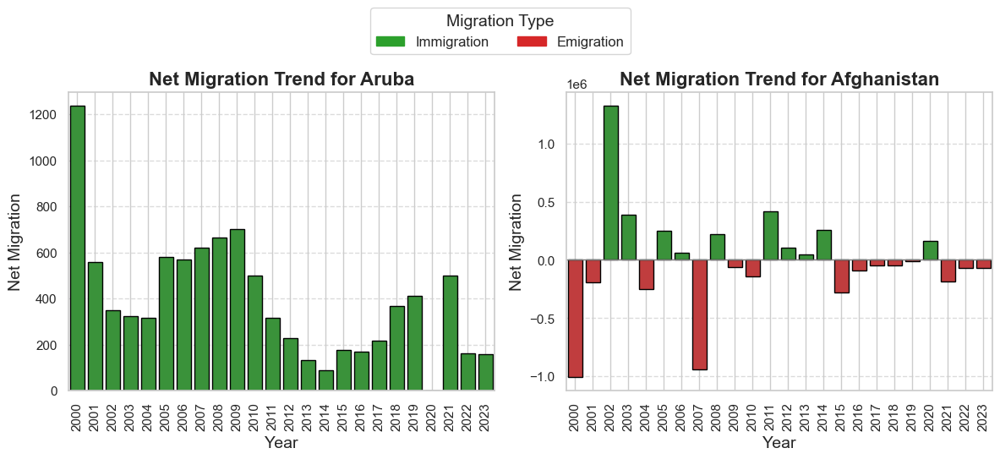

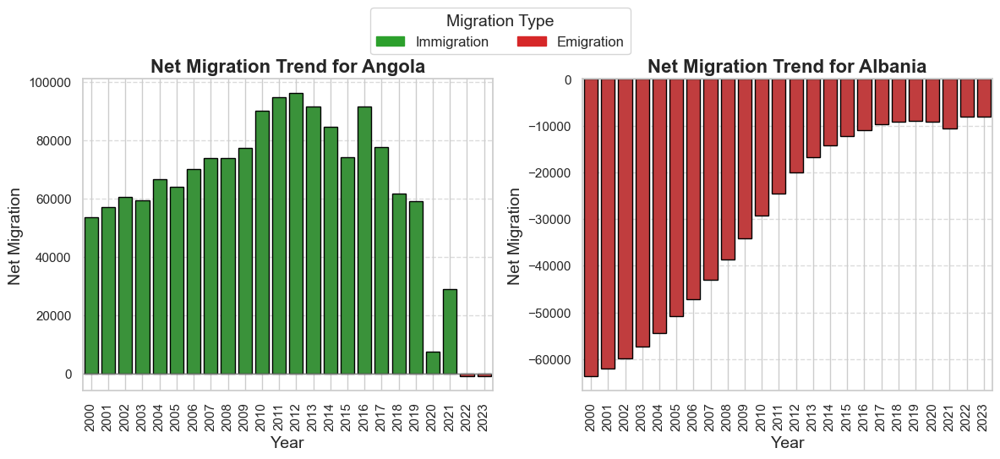

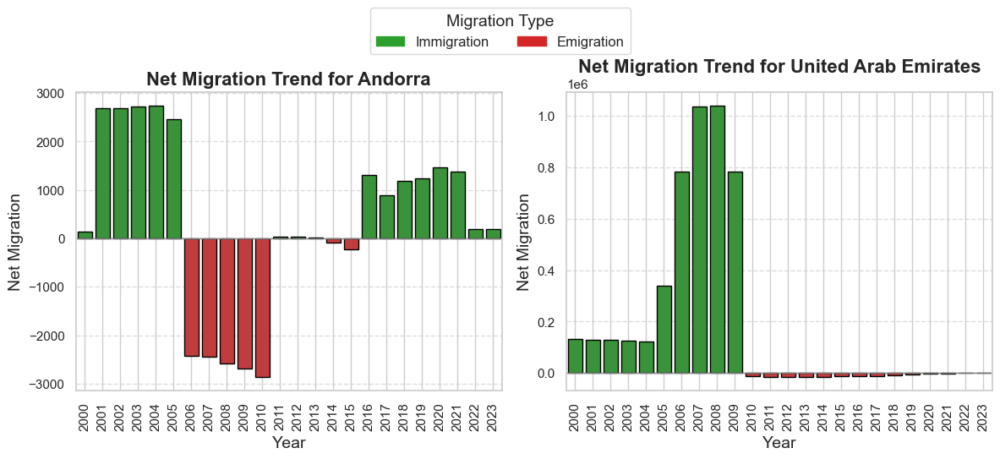

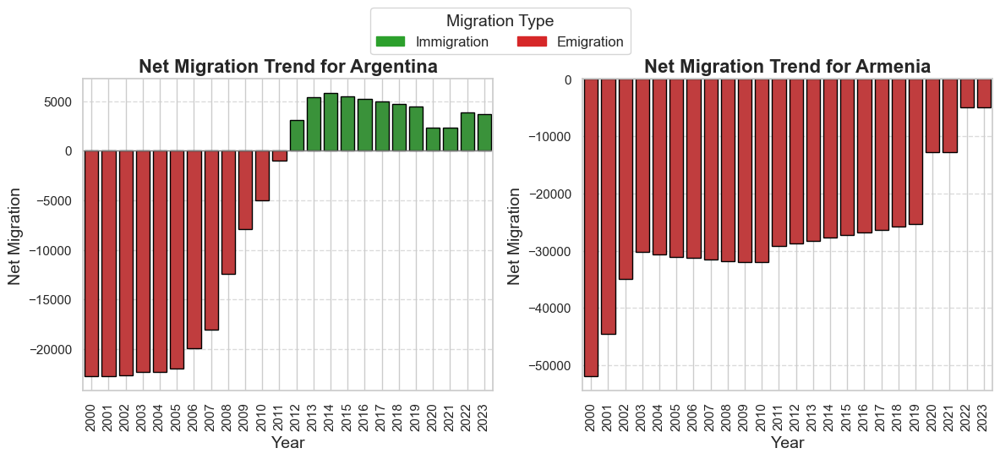

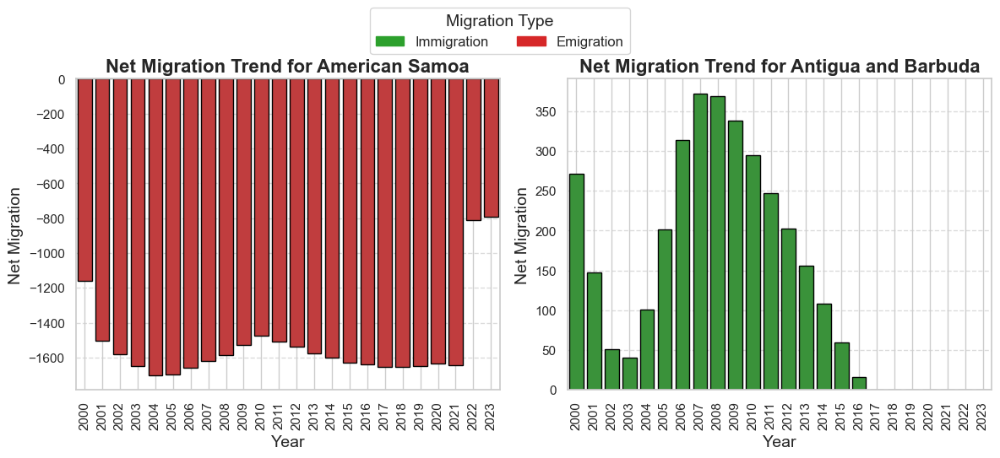

...

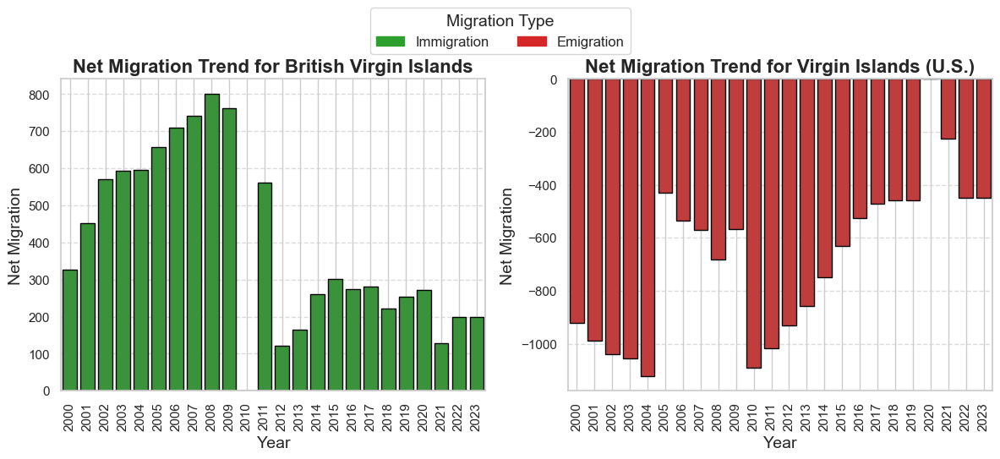

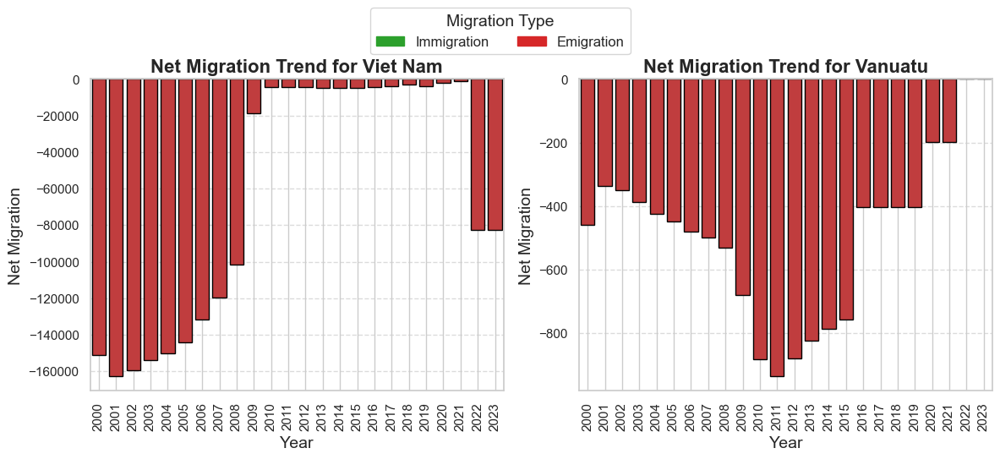

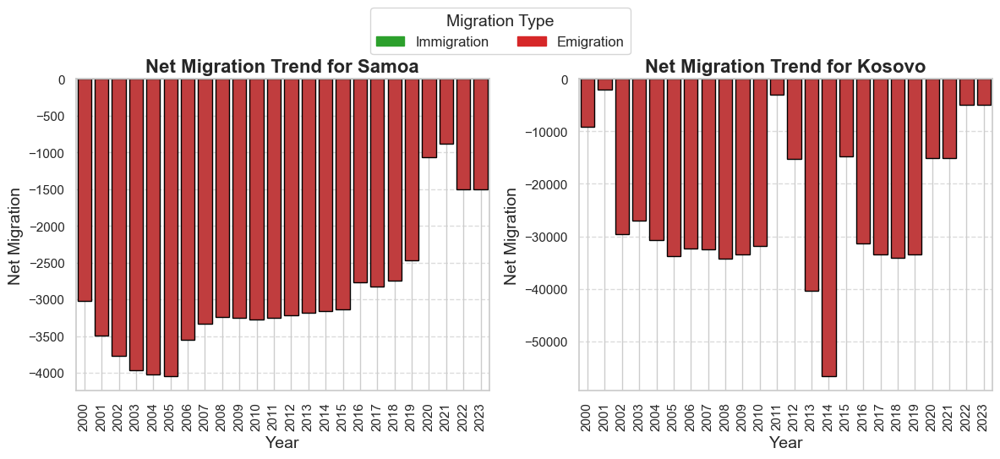

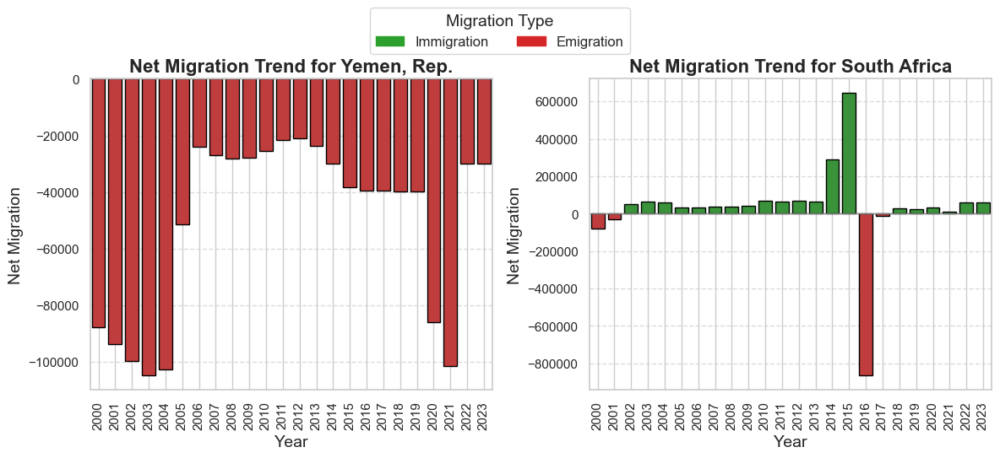

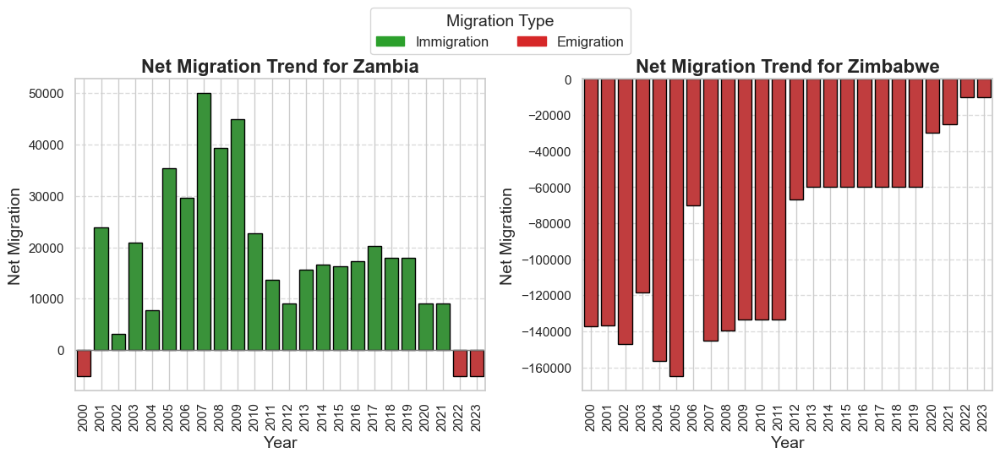

In [34]:
from matplotlib.patches import Patch 

sns.set(style='whitegrid')

unique_countries = df_melted['Country Name'].unique()

for i in range(0, len(unique_countries), 2):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    if i < len(unique_countries):
        country1 = unique_countries[i]
        country_data1 = df_melted[df_melted['Country Name'] == country1].copy()
        
        country_data1['Migration Type'] = country_data1['Net Migration'].apply(lambda x: 'Immigration' if x > 0 else 'Emigration')

        sns.barplot(data=country_data1, x='Year', y='Net Migration', ax=axes[0], hue='Migration Type', 
                    palette={'Immigration': '#2ca02c', 'Emigration': '#d62728'}, legend=False, edgecolor='black')
        axes[0].set_title(f'Net Migration Trend for {country1}', fontsize=16, fontweight='bold')
        axes[0].set_xlabel('Year', fontsize=14)
        axes[0].set_ylabel('Net Migration', fontsize=14)
        axes[0].tick_params(axis='x', rotation=90)
        axes[0].grid(True) 

        axes[0].grid(axis='y', linestyle='--', alpha=0.7)
        
        axes[0].axhline(y=0, color='grey', linestyle='-', linewidth=1)

    if i + 1 < len(unique_countries):
        country2 = unique_countries[i + 1]
        country_data2 = df_melted[df_melted['Country Name'] == country2].copy()
        
        country_data2['Migration Type'] = country_data2['Net Migration'].apply(lambda x: 'Immigration' if x > 0 else 'Emigration')

        sns.barplot(data=country_data2, x='Year', y='Net Migration', ax=axes[1], hue='Migration Type', 
                    palette={'Immigration': '#2ca02c', 'Emigration': '#d62728'}, legend=False, edgecolor='black')
        axes[1].set_title(f'Net Migration Trend for {country2}', fontsize=16, fontweight='bold')
        axes[1].set_xlabel('Year', fontsize=14)
        axes[1].set_ylabel('Net Migration', fontsize=14)
        axes[1].tick_params(axis='x', rotation=90)
        axes[1].grid(True) 

        axes[1].grid(axis='y', linestyle='--', alpha=0.7)
        
        axes[1].axhline(y=0, color='grey', linestyle='-', linewidth=1)
    
    legend_patches = [Patch(color='#2ca02c', label='Immigration'),
                      Patch(color='#d62728', label='Emigration')]

    fig.legend(handles=legend_patches, title='Migration Type', loc='upper center', 
               bbox_to_anchor=(0.5, 1.1), ncol=2, fontsize=12, title_fontsize=14)

    plt.tight_layout()
    plt.show()

## BAR PLOTS DEPICTING TOP AND BOTTOM TEN COUNTRIES BY NET MIGRATION IN 2000

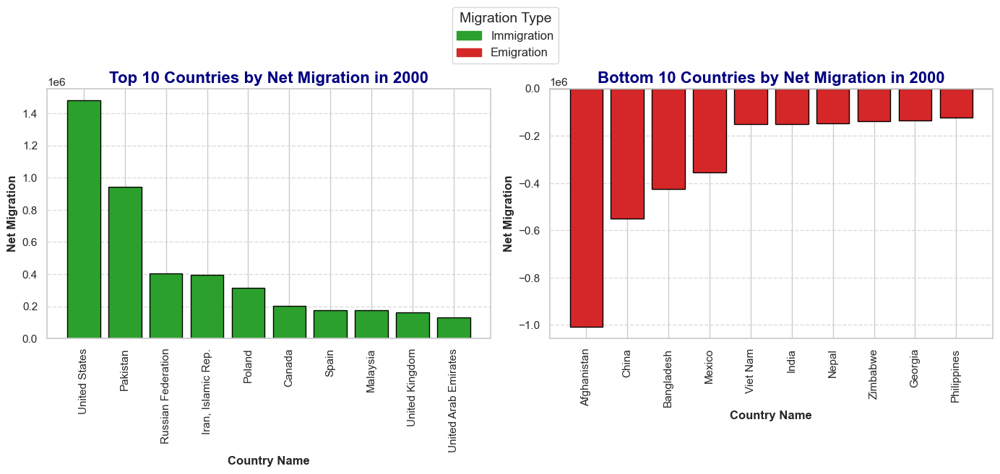

In [35]:
sns.set(style="whitegrid")

df_2000 = df_melted[df_melted['Year'] == 2000]

top_10_countries = df_2000.sort_values(by='Net Migration', ascending=False).head(10)
bottom_10_countries = df_2000.sort_values(by='Net Migration', ascending=True).head(10)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

top_colors = ['#2ca02c' if val >= 0 else '#d62728' for val in top_10_countries['Net Migration']]
bottom_colors = ['#d62728' if val < 0 else '#2ca02c' for val in bottom_10_countries['Net Migration']]

bars_top = axes[0].bar(top_10_countries['Country Name'], top_10_countries['Net Migration'], 
                       color=top_colors, edgecolor='black')
axes[0].set_title('Top 10 Countries by Net Migration in 2000', fontsize=16, fontweight='bold', color='navy')
axes[0].set_xlabel('Country Name', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Net Migration', fontsize=12, fontweight='bold')
axes[0].tick_params(axis='x', rotation=90)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)
axes[0].axhline(y=0, color='grey', linestyle='-', linewidth=1)

bars_bottom = axes[1].bar(bottom_10_countries['Country Name'], bottom_10_countries['Net Migration'], 
                          color=bottom_colors, edgecolor='black')
axes[1].set_title('Bottom 10 Countries by Net Migration in 2000', fontsize=16, fontweight='bold', color='navy')
axes[1].set_xlabel('Country Name', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Net Migration', fontsize=12, fontweight='bold')
axes[1].tick_params(axis='x', rotation=90)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)
axes[1].axhline(y=0, color='grey', linestyle='-', linewidth=1)

plt.tight_layout()

legend_patches = [
    Patch(color='#2ca02c', label='Immigration'),
    Patch(color='#d62728', label='Emigration')
]
plt.legend(handles=legend_patches, title='Migration Type', loc='upper center', 
           bbox_to_anchor=(-0.1, 1.35), ncol=1, fontsize=12, title_fontsize=14)

plt.show()

## BAR PLOT DEPICTING TOTAL MIGRATION OF EACH COUNTRY FROM 2000 TO 2023

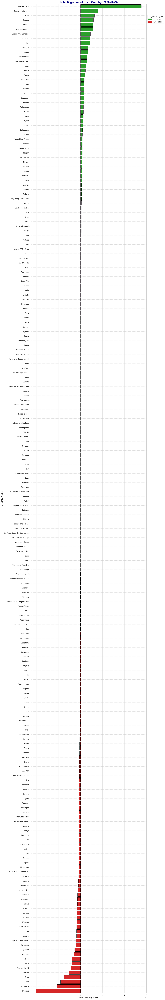

In [36]:
import matplotlib.patches as mpatches
from matplotlib.patches import Patch

sns.set(style="whitegrid")

colors = ['#2ca02c' if value > 0 else '#d62728' for value in total_migration_by_country['Total Migration']]

plt.figure(figsize=(15, 90))

bars = plt.barh(total_migration_by_country['Country Name'], total_migration_by_country['Total Migration'], 
                color=colors, edgecolor='black')

plt.title('Total Migration of Each Country (2000-2023)', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Total Net Migration', fontsize=14, fontweight='bold')
plt.ylabel('Country Name', fontsize=14, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.gca().invert_yaxis()

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.ylim(len(total_migration_by_country) - 0.5, -0.5)

green_patch = mpatches.Patch(color='#2ca02c', label='Immigration')
red_patch = mpatches.Patch(color='#d62728', label='Emigration')

plt.legend(handles=[green_patch, red_patch], title="Migration Type", loc='upper left', 
           bbox_to_anchor=(1, 0.99), ncol=1, fontsize=12, title_fontsize=14)

for bar in bars:
    bar.set_edgecolor('black')

plt.tight_layout()

plt.show()

## BAR PLOT DEPICTING TOP AND BOTTOM TEN COUNTRIES BY TOTAL MIGRATION FROM 2000 TO 2023

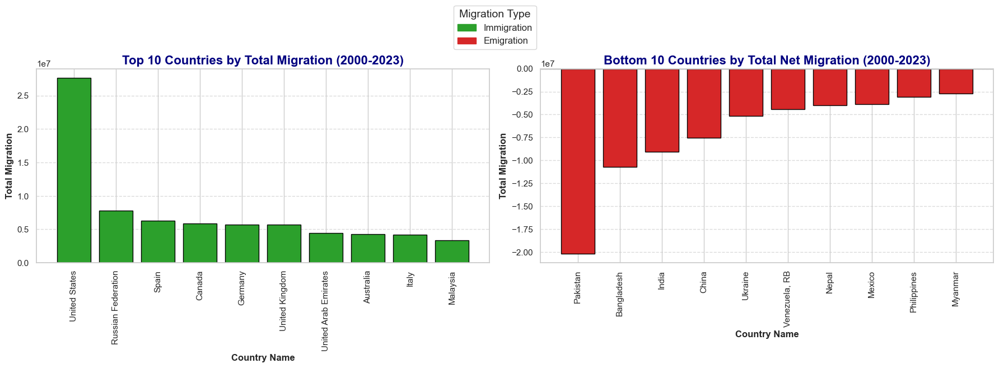

In [37]:
top_10_countries_tot = total_migration_by_country.nlargest(10, 'Total Migration')
bottom_10_countries_tot = total_migration_by_country.nsmallest(10, 'Total Migration')

sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

top_colors = ['#2ca02c' if val >= 0 else '#d62728' for val in top_10_countries_tot['Total Migration']]
bottom_colors = ['#d62728' if val < 0 else '#2ca02c' for val in bottom_10_countries_tot['Total Migration']]

bars_top = axes[0].bar(top_10_countries_tot['Country Name'], top_10_countries_tot['Total Migration'],
                       color=top_colors, edgecolor='black')

axes[0].set_title('Top 10 Countries by Total Migration (2000-2023)', fontsize=16, fontweight='bold', color='navy')
axes[0].set_xlabel('Country Name', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Total Migration', fontsize=12, fontweight='bold')
axes[0].tick_params(axis='x', rotation=90)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)
axes[0].axhline(y=0, color='grey', linestyle='-', linewidth=1)

bars_bottom = axes[1].bar(bottom_10_countries_tot['Country Name'], bottom_10_countries_tot['Total Migration'],
                          color=bottom_colors, edgecolor='black')

axes[1].set_title('Bottom 10 Countries by Total Net Migration (2000-2023)', fontsize=16, fontweight='bold', color='navy')
axes[1].set_xlabel('Country Name', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Total Migration', fontsize=12, fontweight='bold')
axes[1].tick_params(axis='x', rotation=90)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)
axes[1].axhline(y=0, color='grey', linestyle='-', linewidth=1)

plt.tight_layout()

legend_patches = [
    Patch(color='#2ca02c', label='Immigration'),
    Patch(color='#d62728', label='Emigration')
]
plt.legend(handles=legend_patches, title='Migration Type', loc='upper center',
           bbox_to_anchor=(-0.1, 1.35), ncol=1, fontsize=12, title_fontsize=14)

plt.show()

##  BAR PLOTS OF COMPARATIVE NET MIGRATION TRENDS BY REGION (2000-2023)

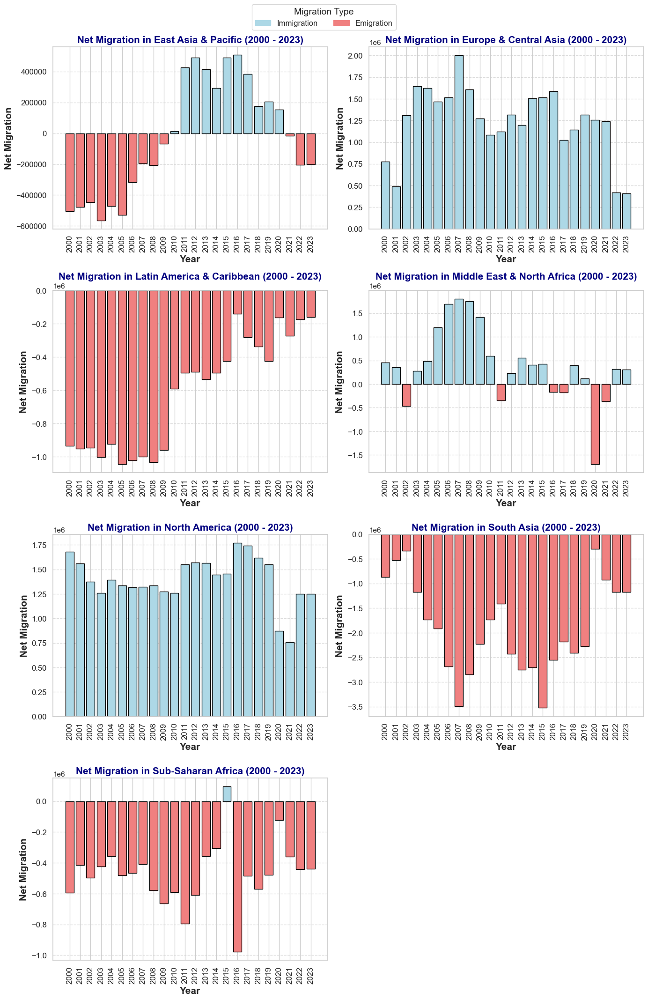

In [38]:
sns.set(style="whitegrid")

regions = net_migration_pivot.index.tolist()

fig, axes = plt.subplots(nrows=(len(regions) + 1) // 2, ncols=2, figsize=(14, len(regions) * 3))

axes = axes.flatten()

positive_color = 'lightblue'
negative_color = 'lightcoral'

for i, region in enumerate(regions):
    region_data = net_migration_pivot.loc[region].reset_index()
    region_data.columns = ['Year', 'Net Migration']
    
    colors = [positive_color if value >= 0 else negative_color for value in region_data['Net Migration']]
    
    axes[i].bar(region_data['Year'], region_data['Net Migration'], color=colors, edgecolor='black')
    
    axes[i].set_title(f'Net Migration in {region} (2000 - 2023)', fontsize=15, fontweight='bold', color='navy')
    axes[i].set_ylabel('Net Migration', fontsize=15, fontweight='bold')
    axes[i].set_xlabel('Year', fontsize=15, fontweight='bold')
    
    axes[i].tick_params(axis='x', rotation=90, labelsize=12)
    axes[i].tick_params(axis='y', labelsize=12)

    axes[i].set_xticks(range(2000, 2024)) 
    axes[i].set_xticklabels(range(2000, 2024), fontsize=12)
    
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    
legend_patches = [Patch(color=positive_color, label='Immigration'),
                  Patch(color=negative_color, label='Emigration')]

fig.legend(handles=legend_patches, title='Migration Type', loc='upper center', 
           bbox_to_anchor=(0.5, 1.02), ncol=2, fontsize=12, title_fontsize=14)

if len(regions) % 2 != 0:
    fig.delaxes(axes[-1])

plt.tight_layout()

plt.show()

## BAR PLOT DEPICTING TOTAL MIGRATION OF EACH REGION FROM 2000 TO 2023

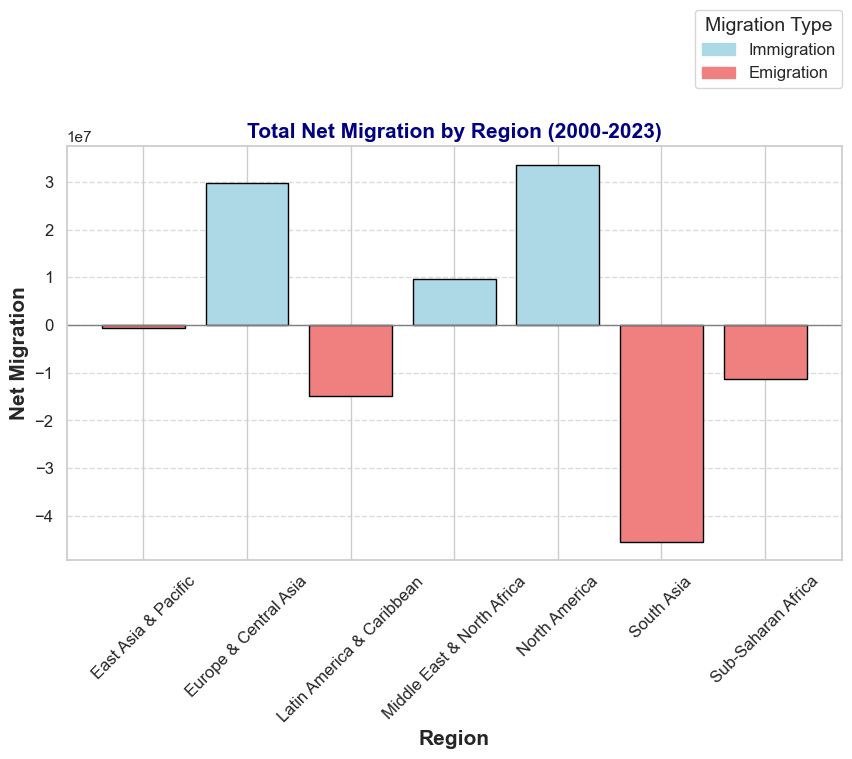

In [39]:
sns.set(style="whitegrid")

total_migration_by_region = df_melted.groupby('Region', observed=False)['Net Migration'].sum().reset_index()

plt.figure(figsize=(10, 6))

colors = ['lightblue' if val >= 0 else 'lightcoral' for val in total_migration_by_region['Net Migration']]

bars = plt.bar(total_migration_by_region['Region'], total_migration_by_region['Net Migration'], 
               color=colors, edgecolor='black')

plt.title('Total Net Migration by Region (2000-2023)', fontsize=15, fontweight='bold', color='navy')
plt.ylabel('Net Migration', fontsize=15, fontweight='bold')
plt.xlabel('Region', fontsize=15, fontweight='bold')

plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.axhline(y=0, color='grey', linestyle='-', linewidth=1)

legend_patches = [
    Patch(color='lightblue', label='Immigration'),
    Patch(color='lightcoral', label='Emigration')
]

plt.legend(handles=legend_patches, title='Migration Type', loc='upper left', 
           bbox_to_anchor=(0.8, 1.35), ncol=1, fontsize=12, title_fontsize=14)

plt.subplots_adjust(top=0.8) 

plt.show()

##  BAR PLOTS OF COMPARATIVE NET MIGRATION TRENDS BY INCOME GROUP (2000-2023)

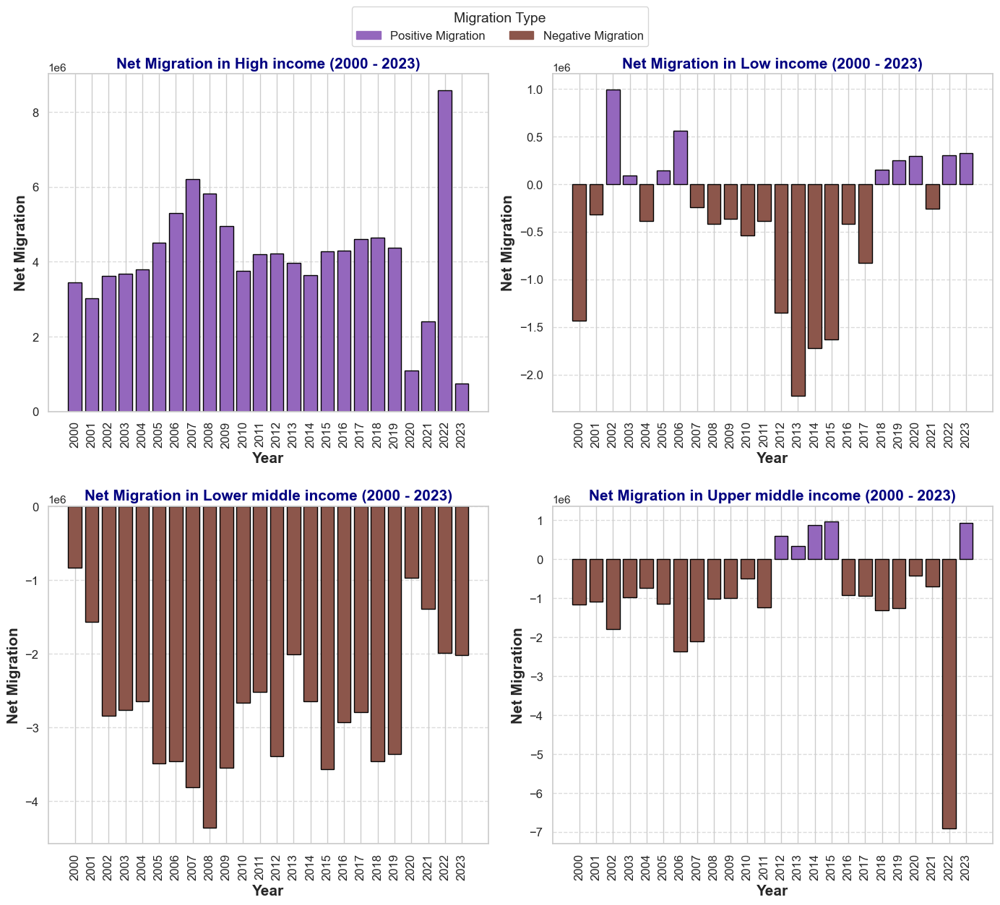

In [40]:
sns.set(style="whitegrid")

IncomeGroups = migration_table.index.tolist()
fig, axes = plt.subplots(nrows=(len(IncomeGroups) + 1) // 2, ncols=2, figsize=(14, len(IncomeGroups) * 3))
axes = axes.flatten()

positive_color = '#9467bd'
negative_color = '#8c564b'

for i, IncomeGroup in enumerate(IncomeGroups):
    IncomeGroup_data = migration_table.loc[IncomeGroup].reset_index()
    IncomeGroup_data.columns = ['Year', 'Net Migration']
    
    colors = [positive_color if value >= 0 else negative_color for value in IncomeGroup_data['Net Migration']]
    
    axes[i].bar(IncomeGroup_data['Year'], IncomeGroup_data['Net Migration'], color=colors, edgecolor='black')
    axes[i].set_title(f'Net Migration in {IncomeGroup} (2000 - 2023)', fontsize=15, fontweight='bold', color='navy')
    axes[i].set_ylabel('Net Migration', fontsize=15, fontweight='bold')
    axes[i].set_xlabel('Year', fontsize=15, fontweight='bold')
    axes[i].tick_params(axis='x', rotation=90, labelsize=12)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].set_xticks(range(2000, 2024))
    axes[i].set_xticklabels(range(2000, 2024), fontsize=12)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

legend_patches = [Patch(color=positive_color, label='Positive Migration'),
                  Patch(color=negative_color, label='Negative Migration')]

fig.legend(handles=legend_patches, title='Migration Type', loc='upper center', 
           bbox_to_anchor=(0.5, 1.05), ncol=2, fontsize=12, title_fontsize=14)

if len(IncomeGroups) % 2 != 0:
    fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

## BAR PLOT DEPICTING TOTAL MIGRATION OF EACH INCOME GROUP FROM 2000 TO 2023

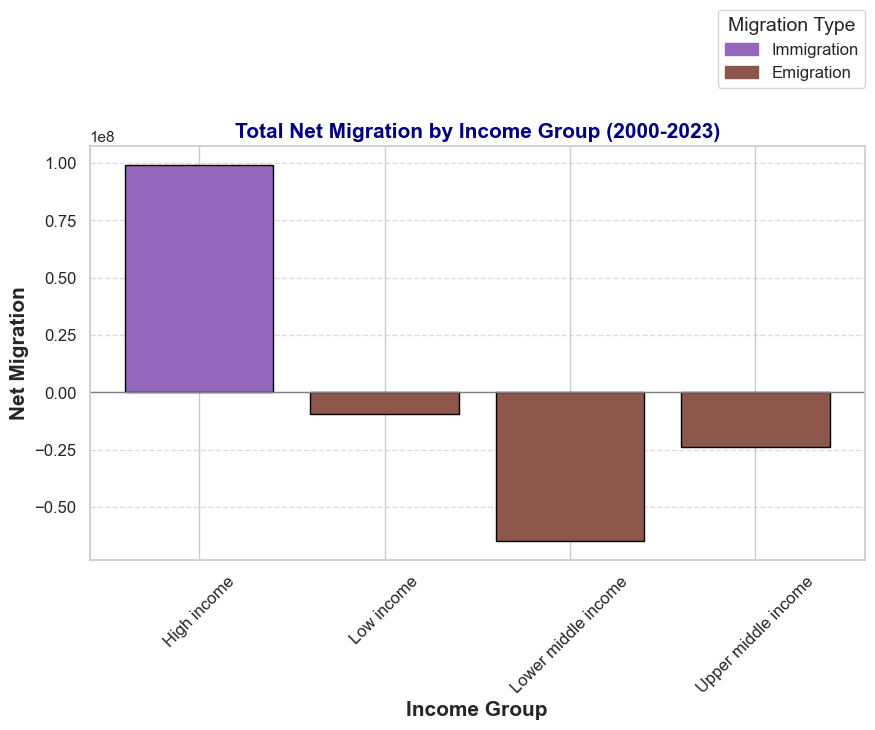

In [41]:
sns.set(style="whitegrid")

total_migration_by_ig = df_melted.groupby('IncomeGroup', observed=False)['Net Migration'].sum().reset_index()

plt.figure(figsize=(10, 6))

colors = ['#9467bd' if val >= 0 else '#8c564b' for val in total_migration_by_ig['Net Migration']]

bars = plt.bar(total_migration_by_ig['IncomeGroup'], total_migration_by_ig['Net Migration'], 
               color=colors, edgecolor='black')

plt.title('Total Net Migration by Income Group (2000-2023)', fontsize=15, fontweight='bold', color='navy')
plt.ylabel('Net Migration', fontsize=15, fontweight='bold')
plt.xlabel('Income Group', fontsize=15, fontweight='bold')

plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.axhline(y=0, color='grey', linestyle='-', linewidth=1)

legend_patches = [
    Patch(color='#9467bd', label='Immigration'),
    Patch(color='#8c564b', label='Emigration')
]

plt.legend(handles=legend_patches, title='Migration Type', loc='upper left', 
           bbox_to_anchor=(0.8, 1.35), ncol=1, fontsize=12, title_fontsize=14)

plt.subplots_adjust(top=0.8) 

plt.show()

## HISTOGRAM DEPICTING FREQUENCIES OF COUNTRIES BY NET MIGRATION DISTRIBUTION FROM 2000 TO 2023

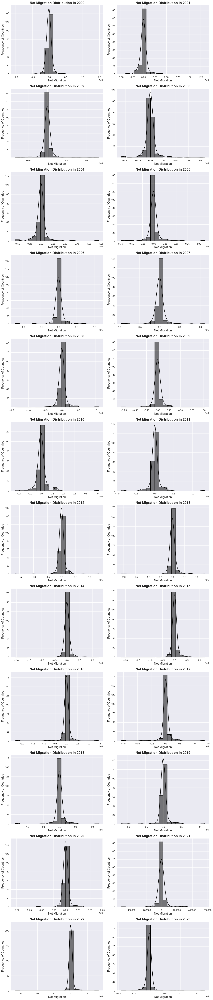

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="darkgrid")

years = range(2000, 2024)

fig, axes = plt.subplots(nrows=(len(years) + 1) // 2, ncols=2, figsize=(14, (len(years) // 2 + 1) * 5))
axes = axes.flatten()

for i, year in enumerate(years):
    year_data = df_melted[df_melted['Year'] == year]['Net Migration']
    
    sns.histplot(year_data, bins=20, ax=axes[i], kde=True, color='black', edgecolor='black')
    
    axes[i].set_title(f'Net Migration Distribution in {year}', fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Net Migration', fontsize=14)
    axes[i].set_ylabel('Frequency of Countries', fontsize=14)

plt.tight_layout()
plt.show()

## HISTOGRAM DEPICTING FREQUENCIES OF COUNTRIES BY TOTAL NET MIGRATION DISTRIBUTION FROM 2000 TO 2023

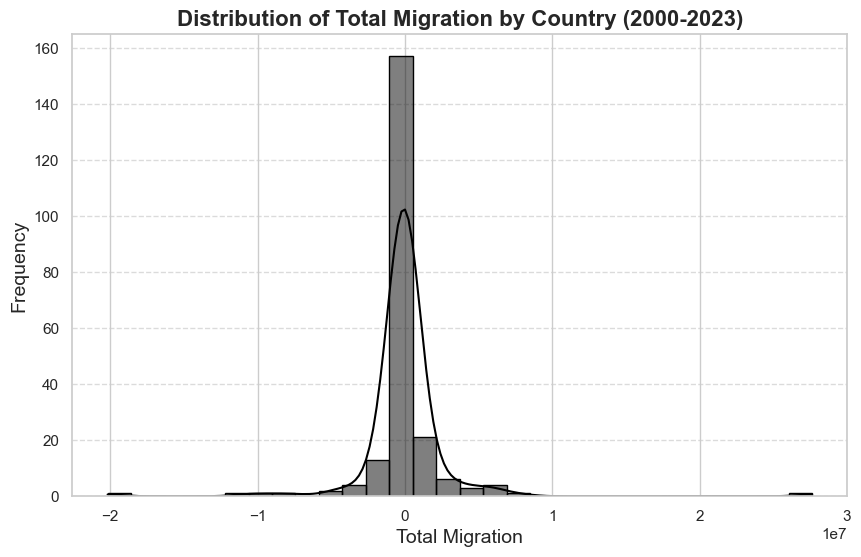

In [43]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.histplot(total_migration_by_country['Total Migration'], bins=30, kde=True, color="black", edgecolor='black')

plt.title('Distribution of Total Migration by Country (2000-2023)', fontsize=16, weight='bold')
plt.xlabel('Total Migration', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

## HISTOGRAM DEPICTING FREQUENCIES OF COUNTRIES BY NET MIGRATION DISTRIBUTION BY REGIONS FROM 2000 TO 2023

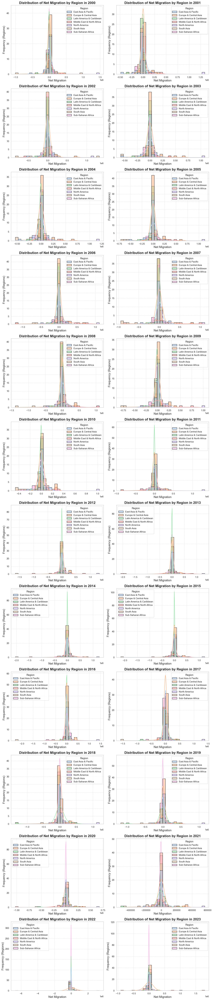

In [44]:
sns.set(style="whitegrid")

palette = sns.color_palette("pastel", n_colors=len(df_melted['Region'].unique()))

years = range(2000, 2024)
num_years = len(years)

fig, axes = plt.subplots(nrows=(num_years + 1) // 2, ncols=2, figsize=(14, (num_years // 2 + 1) * 5))
axes = axes.flatten()

for i, year in enumerate(years):
    year_data = df_melted[df_melted['Year'] == year]
    
    sns.histplot(data=year_data,
                 x='Net Migration',
                 hue='Region',
                 bins=30,
                 kde=True,
                 edgecolor='black',
                 multiple="layer",
                 palette=palette,
                 ax=axes[i])

    axes[i].set_title(f'Distribution of Net Migration by Region in {year}', fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Net Migration', fontsize=14)
    axes[i].set_ylabel('Frequency (Regions)', fontsize=14)


    axes[i].grid(visible=True, linestyle='--', linewidth=0.5)
    

plt.tight_layout()
plt.show()

## HISTOGRAM DEPICTING FREQUENCIES OF COUNTRIES BY NET MIGRATION DISTRIBUTION BY REGIONS FROM 2000 TO 2023

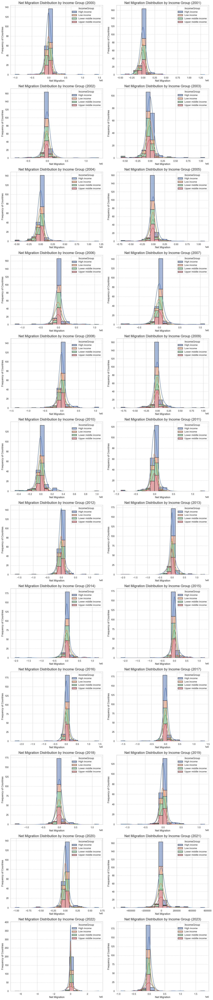

In [45]:
years = range(2000, 2024)
num_years = len(years)
fig, axes = plt.subplots(nrows=(num_years + 1) // 2, ncols=2, figsize=(14, (num_years // 2 + 1) * 5))
axes = axes.flatten()

for i, year in enumerate(years):
    year_data = df_melted[df_melted['Year'] == year]

    sns.histplot(data=year_data, x='Net Migration', hue='IncomeGroup', multiple='stack', bins=20, ax=axes[i], kde=True, edgecolor='black')
    
    axes[i].set_title(f'Net Migration Distribution by Income Group ({year})', fontsize=16)
    axes[i].set_xlabel('Net Migration', fontsize=12)
    axes[i].set_ylabel('Frequency of Countries', fontsize=12)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## HISTOGRAM DEPICTING YEARLY CHANGES IN NET MIGRATION BY COUNTRY FROM 2000 TO 2023

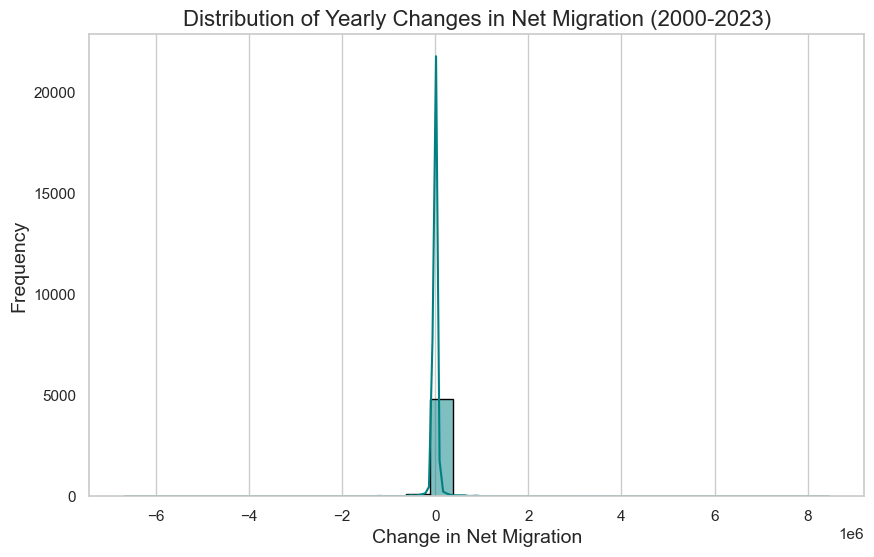

In [46]:
sns.set_style("whitegrid")

df_melted['Net Migration Change'] = df_melted.groupby('Country Name')['Net Migration'].diff()

plt.figure(figsize=(10, 6))
sns.histplot(df_melted['Net Migration Change'].dropna(), bins=30, kde=True, color='teal', edgecolor='black')

plt.title('Distribution of Yearly Changes in Net Migration (2000-2023)', fontsize=16)
plt.xlabel('Change in Net Migration', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.grid(axis='y')

plt.show()